# Midterm (Notebook 2 of 2) #

## Carolyn Chu and Leslie Velasquez ##

This notebook is for the UP206a midterm project and is the second notebook of two. We explore our research question, "where do we need more parks in LA?" by analyzing ACS data on median household income and race, as well as maps of parks from Los Angeles City Recreation and Parks. In Section 5, I analyze race of the highest and lowest median income areas in Los Angeles, and in Section 6, I create an interactive folium map of parks in Los Angeles.

## Section 5: Analyzing Race by Median Income in Los Angeles ##
Building off of the work in the first notebook, in addition to analyzing disparities in median income using census data, we want to determine the racial demographics of the census tracts with the 5 highest and 10 lowest median incomes. To do this, we use "Median Household Income in the Past 12 Months (in 2019 Inflation-adjusted Dollars)" from the American Community Survey 5-year estimates (2015-2019) and "Hispanic or Latino Origin by Race" from the American Community Survey 5-year estimates (2015-2019). 

### Importing Libraries ###

In [1]:
import urllib.request, json 
import pandas as pd   # for data analysis
import geopandas as gpd   # for analyzing spatial data
import contextily as ctx   # for base maps
import matplotlib.pyplot as plt   # for plotting data
import plotly.express as px   # for interactive plots
import folium   # for interactive maps

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


### Manipulate Census Household Income Data to Determine and Isolate 5 Highest Median Income Census Tracts and 10 Lowest ###
In order to analyze race in the highest and lowest income areas of Los Angeles, I will need to recreate work from the first notebook to isolate the high and low income census tracts we wish to study.

In [6]:
# import median household income geojson data from censusreporter
census_inc = gpd.read_file("acs2019_5yr_B19013_14000US06037222001.geojson")

In [7]:
# get a preliminary look at the data
census_inc.head()

,geoid,name,B19013001,"B19013001, Error",geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,16806.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,9796.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,9483.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,4639.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,11857.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [8]:
# list the columns
list(census_inc)

['geoid', 'name', 'B19013001', 'B19013001, Error', 'geometry']

In [9]:
# rename the third and fourth column to Median Household Income and Margin of Error
# refer to metadata for any clarification needed
census_inc.columns = ['geoid', 'name', 'Median Household Income', 'Margin of Error', 'geometry']

In [10]:
# check to make sure the columns have been changed
census_inc.head()

,geoid,name,Median Household Income,Margin of Error,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,16806.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,9796.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,9483.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,4639.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,11857.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [11]:
# sort census tracts by highest median household income
census_inc.sort_values(by='Median Household Income',ascending = False).head(5)

,geoid,name,Median Household Income,Margin of Error,geometry
831,14000US06037262303,"Census Tract 2623.03, Los Angeles, CA",250001.0,NaN,"MULTIPOLYGON (((-118.49599 34.07105, -118.4959..."
832,14000US06037262400,"Census Tract 2624, Los Angeles, CA",250001.0,NaN,"MULTIPOLYGON (((-118.52146 34.11764, -118.5214..."
340,14000US06037141700,"Census Tract 1417, Los Angeles, CA",250001.0,NaN,"MULTIPOLYGON (((-118.45322 34.13557, -118.4531..."
994,14000US06037980019,"Census Tract 9800.19, Los Angeles, CA",231250.0,117385.0,"MULTIPOLYGON (((-118.59919 34.07436, -118.5991..."
833,14000US06037262501,"Census Tract 2625.01, Los Angeles, CA",224962.0,24985.0,"MULTIPOLYGON (((-118.52914 34.04991, -118.5290..."


In [15]:
# use a query command to create a new variable with the 5 census tracts with highest median incomes
census_inchigh = census_inc.loc[[831, 832, 340, 994, 833]]

<AxesSubplot:>

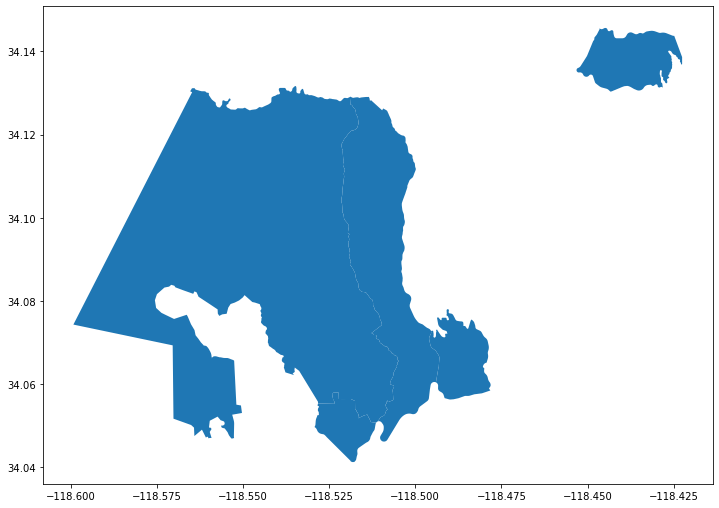

In [13]:
# plot the census tracts with the 5 highest median incomes in order to confirm they are consistent with the first notebook
census_inchigh.plot(figsize=(12,12))

In [16]:
# sort census lowest median household income
census_inc.sort_values(by='Median Household Income',ascending = True).head(10)

,geoid,name,Median Household Income,Margin of Error,geometry
536,14000US06037206300,"Census Tract 2063, Los Angeles, CA",9191.0,2804.0,"MULTIPOLYGON (((-118.25041 34.04326, -118.2490..."
691,14000US06037222700,"Census Tract 2227, Los Angeles, CA",9632.0,7616.0,"MULTIPOLYGON (((-118.29154 34.02550, -118.2912..."
700,14000US06037224700,"Census Tract 2247, Los Angeles, CA",11576.0,3918.0,"MULTIPOLYGON (((-118.28391 34.02389, -118.2838..."
683,14000US06037221820,"Census Tract 2218.20, Los Angeles, CA",12235.0,2899.0,"MULTIPOLYGON (((-118.28882 34.03276, -118.2874..."
820,14000US06037242600,"Census Tract 2426, Los Angeles, CA",16586.0,3141.0,"MULTIPOLYGON (((-118.25425 33.93097, -118.2542..."
684,14000US06037221900,"Census Tract 2219, Los Angeles, CA",17237.0,8026.0,"MULTIPOLYGON (((-118.29590 34.02716, -118.2959..."
817,14000US06037242100,"Census Tract 2421, Los Angeles, CA",18177.0,3825.0,"MULTIPOLYGON (((-118.23675 33.94491, -118.2367..."
544,14000US06037207502,"Census Tract 2075.02, Los Angeles, CA",18594.0,2695.0,"MULTIPOLYGON (((-118.25855 34.05308, -118.2583..."
991,14000US06037980010,"Census Tract 9800.10, Los Angeles, CA",19167.0,11351.0,"MULTIPOLYGON (((-118.25165 34.08038, -118.2515..."
850,14000US06037265305,"Census Tract 2653.05, Los Angeles, CA",20655.0,8015.0,"MULTIPOLYGON (((-118.45313 34.06400, -118.4527..."


In [17]:
# use a query command to create a new variable with the 10 census tracts with lowest median incomes
census_inclow = census_inc.loc[[536, 691, 700, 683, 820, 684, 817, 544, 991, 850]]

<AxesSubplot:>

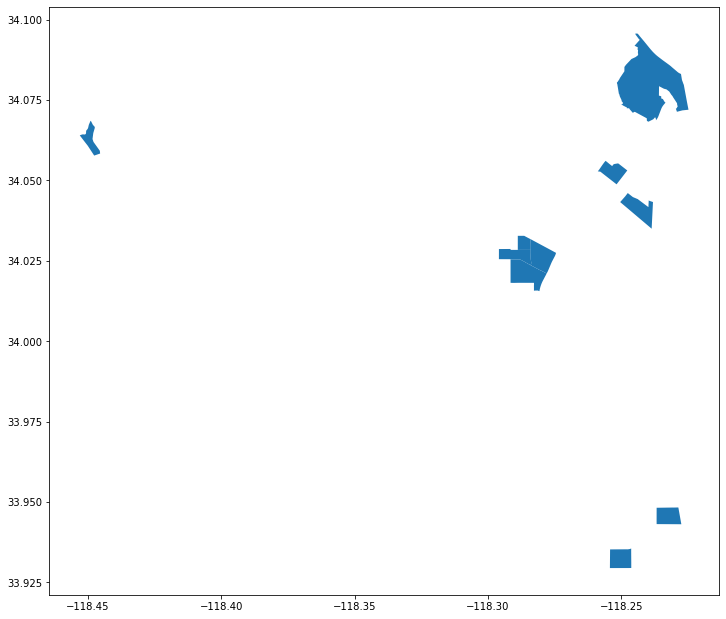

In [18]:
# plot the census tracts with the 10 lowest median incomes in order to confirm they are consistent with the first notebook
census_inclow.plot(figsize=(12,12))

### Isolate the 10 lowest and 5 highest median income census tracts within the census data on race ###
Now that I have identified the census tracts with the highest and lowest median incomes, I can find those tracts within the census dataset on racial demographics.

In [19]:
# import racial demographics geojson data from censusreporter
census_race = gpd.read_file("acs2019_5yr_B03002_14000US06037222001.geojson")

In [20]:
# get a preliminary look at the data
census_race.head()

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,443.0,3095.0,354.0,2616.0,306.0,19.0,15.0,...,12.0,383.0,311.0,74.0,52.0,34.0,28.0,40.0,46.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,334.0,3258.0,344.0,2882.0,358.0,74.0,102.0,...,12.0,48.0,55.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,484.0,3731.0,465.0,2986.0,435.0,198.0,165.0,...,17.0,874.0,477.0,81.0,80.0,48.0,62.0,33.0,51.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,276.0,2338.0,236.0,1812.0,271.0,87.0,107.0,...,12.0,497.0,231.0,45.0,42.0,11.0,18.0,34.0,39.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,394.0,3587.0,363.0,3126.0,359.0,205.0,232.0,...,12.0,45.0,38.0,28.0,32.0,28.0,32.0,0.0,12.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [21]:
# list the columns
list(census_race)

['geoid',
 'name',
 'B03002001',
 'B03002001, Error',
 'B03002002',
 'B03002002, Error',
 'B03002003',
 'B03002003, Error',
 'B03002004',
 'B03002004, Error',
 'B03002005',
 'B03002005, Error',
 'B03002006',
 'B03002006, Error',
 'B03002007',
 'B03002007, Error',
 'B03002008',
 'B03002008, Error',
 'B03002009',
 'B03002009, Error',
 'B03002010',
 'B03002010, Error',
 'B03002011',
 'B03002011, Error',
 'B03002012',
 'B03002012, Error',
 'B03002013',
 'B03002013, Error',
 'B03002014',
 'B03002014, Error',
 'B03002015',
 'B03002015, Error',
 'B03002016',
 'B03002016, Error',
 'B03002017',
 'B03002017, Error',
 'B03002018',
 'B03002018, Error',
 'B03002019',
 'B03002019, Error',
 'B03002020',
 'B03002020, Error',
 'B03002021',
 'B03002021, Error',
 'geometry']

In [22]:
# simplify data by deleting some columns
columns_to_keep = ['geoid',
 'name',
 'B03002001',
 'B03002002',
 'B03002003',
 'B03002004',
 'B03002005',
 'B03002006',
 'B03002007',
 'B03002008',
 'B03002009',
 'B03002012',
 'geometry']

In [23]:
census_race = census_race[columns_to_keep]

In [25]:
# check data to make sure changes have been made
census_race.head()

,geoid,name,B03002001,B03002002,B03002003,B03002004,B03002005,B03002006,B03002007,B03002008,B03002009,B03002012,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,3095.0,2616.0,19.0,3.0,331.0,3.0,8.0,115.0,1188.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,3258.0,2882.0,74.0,15.0,220.0,0.0,0.0,67.0,147.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3731.0,2986.0,198.0,0.0,486.0,0.0,47.0,14.0,2616.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,2338.0,1812.0,87.0,0.0,341.0,0.0,0.0,98.0,1364.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,3587.0,3126.0,205.0,0.0,194.0,0.0,0.0,62.0,297.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [26]:
# rename the columns representing race to make it clear what each is
# refer to metadata for any clarification needed

census_race.columns = ['geoid',
 'name',
 'Total',
 'Non Hispanic',
 'Non Hispanic White',
 'Non Hispanic Black',
 'Non Hispanic American Indian and Alaska Native',
 'Non Hispanic Asian',
 'Non Hispanic Native Hawaiian and Other Pacific Islander',
 'Non Hispanic Some other race',
 'Non Hispanic Two or more races',
 'Hispanic',
 'geometry']

In [27]:
# make sure changes have been made
census_race.head()

,geoid,name,Total,Non Hispanic,Non Hispanic White,Non Hispanic Black,Non Hispanic American Indian and Alaska Native,Non Hispanic Asian,Non Hispanic Native Hawaiian and Other Pacific Islander,Non Hispanic Some other race,Non Hispanic Two or more races,Hispanic,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,3095.0,2616.0,19.0,3.0,331.0,3.0,8.0,115.0,1188.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,3258.0,2882.0,74.0,15.0,220.0,0.0,0.0,67.0,147.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3731.0,2986.0,198.0,0.0,486.0,0.0,47.0,14.0,2616.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,2338.0,1812.0,87.0,0.0,341.0,0.0,0.0,98.0,1364.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,3587.0,3126.0,205.0,0.0,194.0,0.0,0.0,62.0,297.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [40]:
# sort by highest population to remove the Los Angeles city row
census_race.sort_values(by='Total',ascending = False).head(5)

,geoid,name,Total,Non Hispanic,Non Hispanic White,Non Hispanic Black,Non Hispanic American Indian and Alaska Native,Non Hispanic Asian,Non Hispanic Native Hawaiian and Other Pacific Islander,Non Hispanic Some other race,Non Hispanic Two or more races,Hispanic,geometry
922,14000US06037275602,"Census Tract 2756.02, Los Angeles, CA",12100.0,10449.0,6371.0,795.0,0.0,2802.0,0.0,0.0,481.0,1651.0,"MULTIPOLYGON (((-118.43226 33.97502, -118.4292..."
847,14000US06037265301,"Census Tract 2653.01, Los Angeles, CA",11977.0,9290.0,3160.0,486.0,17.0,4808.0,19.0,22.0,778.0,2687.0,"MULTIPOLYGON (((-118.45549 34.07585, -118.4546..."
531,14000US06037206020,"Census Tract 2060.20, Los Angeles, CA",8947.0,5083.0,1657.0,2773.0,51.0,328.0,49.0,59.0,166.0,3864.0,"MULTIPOLYGON (((-118.23787 34.05427, -118.2378..."
84,14000US06037111400,"Census Tract 1114, Los Angeles, CA",8735.0,5011.0,3376.0,390.0,0.0,1227.0,0.0,18.0,0.0,3724.0,"MULTIPOLYGON (((-118.50240 34.25117, -118.5023..."
128,14000US06037119002,"Census Tract 1190.02, Los Angeles, CA",7976.0,1332.0,410.0,89.0,0.0,766.0,0.0,9.0,58.0,6644.0,"MULTIPOLYGON (((-118.44012 34.25295, -118.4386..."


In [37]:
# drop the Los Angeles city row - error appearing because I ran the cell twice
census_race = census_race.drop([1004])

KeyError: '[1004] not found in axis'

In [39]:
# check to make sure it has been dropped
census_race.sort_values(by='Total',ascending = False).head(5)

,geoid,name,Total,Non Hispanic,Non Hispanic White,Non Hispanic Black,Non Hispanic American Indian and Alaska Native,Non Hispanic Asian,Non Hispanic Native Hawaiian and Other Pacific Islander,Non Hispanic Some other race,Non Hispanic Two or more races,Hispanic,geometry
922,14000US06037275602,"Census Tract 2756.02, Los Angeles, CA",12100.0,10449.0,6371.0,795.0,0.0,2802.0,0.0,0.0,481.0,1651.0,"MULTIPOLYGON (((-118.43226 33.97502, -118.4292..."
847,14000US06037265301,"Census Tract 2653.01, Los Angeles, CA",11977.0,9290.0,3160.0,486.0,17.0,4808.0,19.0,22.0,778.0,2687.0,"MULTIPOLYGON (((-118.45549 34.07585, -118.4546..."
531,14000US06037206020,"Census Tract 2060.20, Los Angeles, CA",8947.0,5083.0,1657.0,2773.0,51.0,328.0,49.0,59.0,166.0,3864.0,"MULTIPOLYGON (((-118.23787 34.05427, -118.2378..."
84,14000US06037111400,"Census Tract 1114, Los Angeles, CA",8735.0,5011.0,3376.0,390.0,0.0,1227.0,0.0,18.0,0.0,3724.0,"MULTIPOLYGON (((-118.50240 34.25117, -118.5023..."
128,14000US06037119002,"Census Tract 1190.02, Los Angeles, CA",7976.0,1332.0,410.0,89.0,0.0,766.0,0.0,9.0,58.0,6644.0,"MULTIPOLYGON (((-118.44012 34.25295, -118.4386..."


In [41]:
# isolate 5 highest median income census tracts
census_race.loc[[831, 832, 340, 994, 833]]

,geoid,name,Total,Non Hispanic,Non Hispanic White,Non Hispanic Black,Non Hispanic American Indian and Alaska Native,Non Hispanic Asian,Non Hispanic Native Hawaiian and Other Pacific Islander,Non Hispanic Some other race,Non Hispanic Two or more races,Hispanic,geometry
831,14000US06037262303,"Census Tract 2623.03, Los Angeles, CA",3038.0,2957.0,2595.0,0.0,40.0,184.0,0.0,0.0,138.0,81.0,"MULTIPOLYGON (((-118.49599 34.07105, -118.4959..."
832,14000US06037262400,"Census Tract 2624, Los Angeles, CA",3059.0,2986.0,2685.0,84.0,11.0,143.0,0.0,0.0,63.0,73.0,"MULTIPOLYGON (((-118.52146 34.11764, -118.5214..."
340,14000US06037141700,"Census Tract 1417, Los Angeles, CA",3161.0,2974.0,2604.0,48.0,0.0,217.0,0.0,0.0,105.0,187.0,"MULTIPOLYGON (((-118.45322 34.13557, -118.4531..."
994,14000US06037980019,"Census Tract 9800.19, Los Angeles, CA",138.0,138.0,114.0,0.0,0.0,20.0,4.0,0.0,0.0,0.0,"MULTIPOLYGON (((-118.59919 34.07436, -118.5991..."
833,14000US06037262501,"Census Tract 2625.01, Los Angeles, CA",3785.0,3617.0,3283.0,0.0,9.0,168.0,0.0,0.0,157.0,168.0,"MULTIPOLYGON (((-118.52914 34.04991, -118.5290..."


In [43]:
# create a new variable of the 5 highest median income census tracts in the racial demographic data
censusrace_hiinc = census_race.loc[[831, 832, 340, 994, 833]]

In [44]:
# isolate 10 lowest median income census tracts
census_race.loc[[536, 691, 700, 683, 820, 684, 817, 544, 991, 850]]

,geoid,name,Total,Non Hispanic,Non Hispanic White,Non Hispanic Black,Non Hispanic American Indian and Alaska Native,Non Hispanic Asian,Non Hispanic Native Hawaiian and Other Pacific Islander,Non Hispanic Some other race,Non Hispanic Two or more races,Hispanic,geometry
536,14000US06037206300,"Census Tract 2063, Los Angeles, CA",6103.0,5148.0,1576.0,3097.0,117.0,135.0,12.0,21.0,190.0,955.0,"MULTIPOLYGON (((-118.25041 34.04326, -118.2490..."
691,14000US06037222700,"Census Tract 2227, Los Angeles, CA",4071.0,3497.0,1714.0,288.0,0.0,1328.0,30.0,34.0,103.0,574.0,"MULTIPOLYGON (((-118.29154 34.02550, -118.2912..."
700,14000US06037224700,"Census Tract 2247, Los Angeles, CA",6238.0,5359.0,2530.0,332.0,4.0,2239.0,24.0,23.0,207.0,879.0,"MULTIPOLYGON (((-118.28391 34.02389, -118.2838..."
683,14000US06037221820,"Census Tract 2218.20, Los Angeles, CA",2363.0,1963.0,814.0,231.0,9.0,828.0,8.0,18.0,55.0,400.0,"MULTIPOLYGON (((-118.28882 34.03276, -118.2874..."
820,14000US06037242600,"Census Tract 2426, Los Angeles, CA",4756.0,1712.0,3.0,1624.0,0.0,0.0,0.0,25.0,60.0,3044.0,"MULTIPOLYGON (((-118.25425 33.93097, -118.2542..."
684,14000US06037221900,"Census Tract 2219, Los Angeles, CA",4248.0,3125.0,1117.0,387.0,17.0,1274.0,0.0,27.0,303.0,1123.0,"MULTIPOLYGON (((-118.29590 34.02716, -118.2959..."
817,14000US06037242100,"Census Tract 2421, Los Angeles, CA",2852.0,691.0,4.0,648.0,0.0,0.0,39.0,0.0,0.0,2161.0,"MULTIPOLYGON (((-118.23675 33.94491, -118.2367..."
544,14000US06037207502,"Census Tract 2075.02, Los Angeles, CA",2888.0,2718.0,677.0,280.0,0.0,1701.0,0.0,0.0,60.0,170.0,"MULTIPOLYGON (((-118.25855 34.05308, -118.2583..."
991,14000US06037980010,"Census Tract 9800.10, Los Angeles, CA",95.0,62.0,24.0,1.0,0.0,37.0,0.0,0.0,0.0,33.0,"MULTIPOLYGON (((-118.25165 34.08038, -118.2515..."
850,14000US06037265305,"Census Tract 2653.05, Los Angeles, CA",3990.0,3235.0,1393.0,10.0,1.0,1509.0,0.0,5.0,317.0,755.0,"MULTIPOLYGON (((-118.45313 34.06400, -118.4527..."


In [45]:
# create a new variable of the 10 lowest median income census tracts in the racial demographic data
censusrace_lowinc = census_race.loc[[536, 691, 700, 683, 820, 684, 817, 544, 991, 850]]

### Create Bar Charts of the Racial Demographics of the Highest and Lowest Median Income Census Tracts ###
After isolating these census tracts within the census dataset on race, I use plotly to create charts to analyze the racial demographics of these census tracts, as well as Los Angeles as a whole. 

In [46]:
# pull up columns of these variables in order to create a list of racial groups to use to make stacked bar charts
censusrace_lowinc.columns

Index(['geoid', 'name', 'Total', 'Non Hispanic', 'Non Hispanic White',
       'Non Hispanic Black', 'Non Hispanic American Indian and Alaska Native',
       'Non Hispanic Asian',
       'Non Hispanic Native Hawaiian and Other Pacific Islander',
       'Non Hispanic Some other race', 'Non Hispanic Two or more races',
       'Hispanic', 'geometry'],
      dtype='object')

In [47]:
# create a new variable, race, that lists the columns of racial groups in the data
race = ['Non Hispanic White','Non Hispanic Black', 'Non Hispanic American Indian and Alaska Native','Non Hispanic Asian', 'Non Hispanic Native Hawaiian and Other Pacific Islander','Non Hispanic Some other race', 'Non Hispanic Two or more races','Hispanic']

In [48]:
# check to make sure it works
race

['Non Hispanic White',
 'Non Hispanic Black',
 'Non Hispanic American Indian and Alaska Native',
 'Non Hispanic Asian',
 'Non Hispanic Native Hawaiian and Other Pacific Islander',
 'Non Hispanic Some other race',
 'Non Hispanic Two or more races',
 'Hispanic']

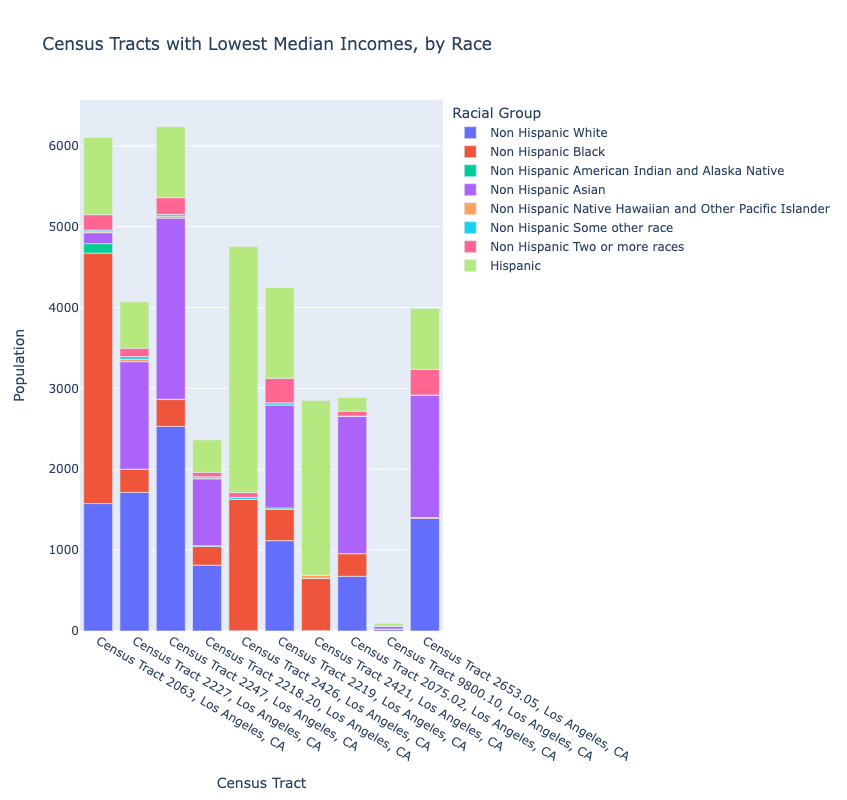

In [49]:
# using the new variable race as the y axis, create a bar chart analyzing racial demographics of the 10 lowest median income census tracts, with racial categories color coded within each bar
fig = px.bar(censusrace_lowinc,
       x='name',
       y=race,
        labels={
                     "name": "Census Tract",
                     "value": "Population",
                    "variable": "Racial Group"
                 },
        title='Census Tracts with Lowest Median Incomes, by Race')

fig.update_layout(
    width = 800,
    height = 800,)

fig.show()

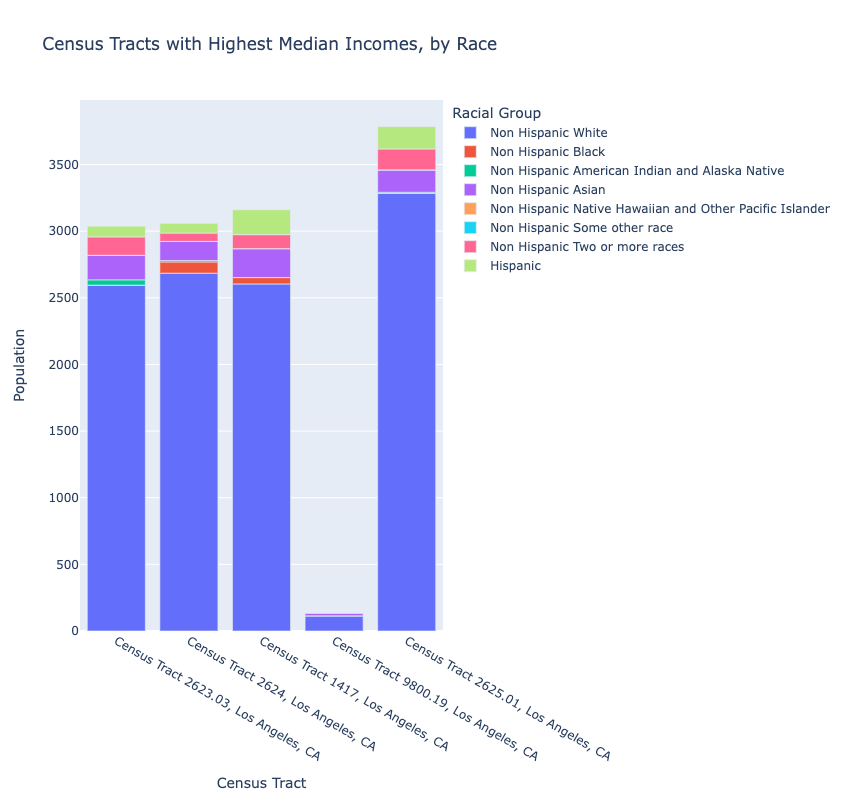

In [50]:
# do the same for the 5 highest median income census tracts
fig = px.bar(censusrace_hiinc,
       x='name',
       y=race,
       labels={
                     "name": "Census Tract",
                     "value": "Population",
                    "variable": "Racial Group"
                 },
        
        title='Census Tracts with Highest Median Incomes, by Race')

fig.update_layout(
    width = 800,
    height = 800,)

fig.show()

### Analyzing Racial Demographics of Los Angeles as a Whole ##
In order to contextualize our analysis of the demographics of the highest and lowest income census tracts, I must analyze the racial demographics of the city of Los Angeles as a whole. 

In [53]:
# import census racial demographic data again
census_la = gpd.read_file("acs2019_5yr_B03002_14000US06037222001.geojson")

In [54]:
# remove extraneous columns to be consistent with previous analysis
census_la = census_la[columns_to_keep]

In [55]:
# rename columns to be more easily understandable
# see metadata for any clarification

census_la.columns = ['geoid',
 'name',
 'Total',
 'Non Hispanic',
 'Non Hispanic White',
 'Non Hispanic Black',
 'Non Hispanic American Indian and Alaska Native',
 'Non Hispanic Asian',
 'Non Hispanic Native Hawaiian and Other Pacific Islander',
 'Non Hispanic Some other race',
 'Non Hispanic Two or more races',
 'Hispanic',
 'geometry']

In [57]:
# check to make sure changes were made
census_la

,geoid,name,Total,Non Hispanic,Non Hispanic White,Non Hispanic Black,Non Hispanic American Indian and Alaska Native,Non Hispanic Asian,Non Hispanic Native Hawaiian and Other Pacific Islander,Non Hispanic Some other race,Non Hispanic Two or more races,Hispanic,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,3095.0,2616.0,19.0,3.0,331.0,3.0,8.0,115.0,1188.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,3258.0,2882.0,74.0,15.0,220.0,0.0,0.0,67.0,147.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3731.0,2986.0,198.0,0.0,486.0,0.0,47.0,14.0,2616.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,2338.0,1812.0,87.0,0.0,341.0,0.0,0.0,98.0,1364.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,3587.0,3126.0,205.0,0.0,194.0,0.0,0.0,62.0,297.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1000,14000US06037980026,"Census Tract 9800.26, Los Angeles, CA",26.0,19.0,7.0,11.0,0.0,0.0,0.0,0.0,1.0,7.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
1001,14000US06037980028,"Census Tract 9800.28, Los Angeles, CA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,788.0,393.0,232.0,26.0,36.0,24.0,25.0,52.0,387.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
1003,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [59]:
# using previous knowledge of which record is LA city, use query command to drop every row except for the LA city row
census_la = census_la.loc[[1004]]

In [62]:
# make sure changes were made
census_la

,geoid,name,Total,Non Hispanic,Non Hispanic White,Non Hispanic Black,Non Hispanic American Indian and Alaska Native,Non Hispanic Asian,Non Hispanic Native Hawaiian and Other Pacific Islander,Non Hispanic Some other race,Non Hispanic Two or more races,Hispanic,geometry
1004,16000US0644000,"Los Angeles, CA",3966936.0,2044527.0,1129956.0,341750.0,6374.0,454688.0,5103.0,14762.0,91894.0,1922409.0,"MULTIPOLYGON (((-118.66818 34.18987, -118.6681..."


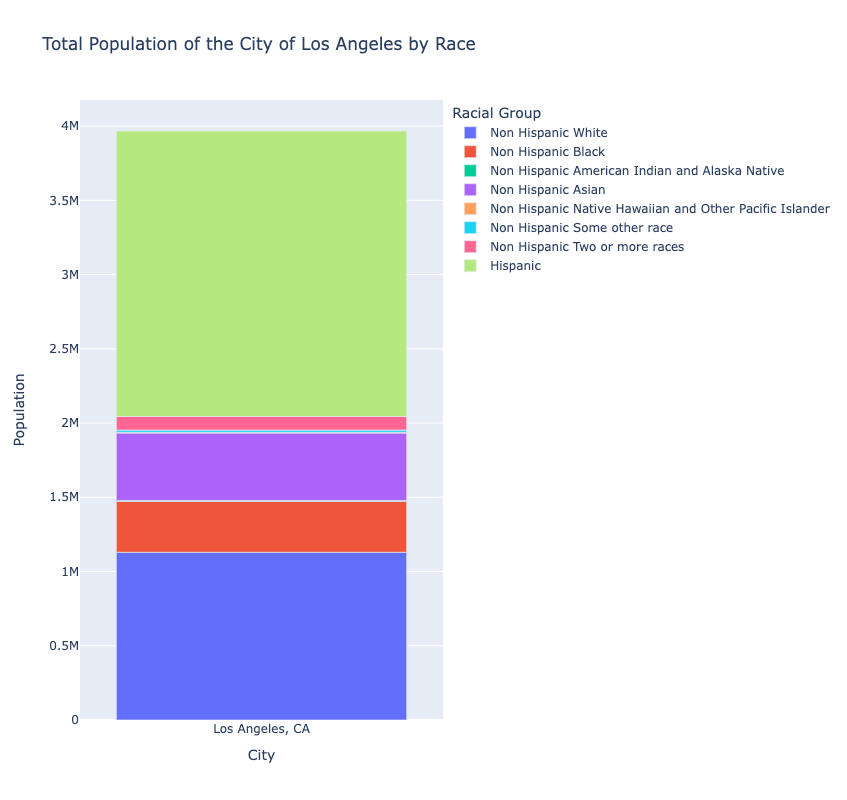

In [63]:
# using race variable as y axis, create a stacked bar chart of the racial demographics of Los Angeles as a whole
fig = px.bar(census_la,
       x='name',
       y=race,
       labels={
                     "name": "City",
                     "value": "Population",
                    "variable": "Racial Group"
                 },
        
        title='Total Population of the City of Los Angeles by Race')

fig.update_layout(
    width = 800,
    height = 800,)

fig.show()

Reflecting on these bar charts, it is clear that the high median income census tracts are much less diverse and much whiter than the low income census tracts and Los Angeles as a whole. This confirms prevailing research which shows that race and income are closely tied together, and for our analysis shows that any shown disparity in parks equity and access will be related to both race and income. 

## Section 6: Creating an Interactive Map of Los Angeles Parks ##
Next, I use a geojson file from the Department of Parks and Recreation and turn it into a folium map in order to get an interactive map of all the parks in the city of Los Angeles. I also create markers with the names and size of the park.

In [64]:
# import parks and recreate geojson file
gdf = gpd.read_file('Recreation_and_Parks_Information.geojson')

In [69]:
# take a preliminary look at the data
gdf.head()

,name,shape_area,objectid,park_id,name_alpha,shape_leng,area_acres,issubpark,region,address,name_publi,park_class,cd_real,geometry
0,Robert F Kennedy Inspiration Memorial Park,6501.37488025,1,1056,ROBERT F KENNEDY PARK (LAUSD) JUA,641.47054538,0.149251627315,N,M,"3400 W Wilshire Blvd, LA 90010",Kennedy (Robert F) Inspiration Memorial Park (...,N,10,"MULTIPOLYGON (((-118.29796 34.06162, -118.2969..."
1,Sycamore Grove Park,691462.199493,2,736,SYCAMORE GROVE PARK,6227.3991903,15.8738513625,N,M,"4702 N Figueroa St, LA 90042",Sycamore Grove Park,C,01,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011..."
2,San Pedro Welcome Park,17402.1579777,3,328,SAN PEDRO WELCOME PARK,560.372862441,0.399500174163,N,P,"451 N Gaffey St, San Pedro 90731",Formerly Welcome Park,N,15,"MULTIPOLYGON (((-118.29286 33.74600, -118.2928..."
3,Country Club Heritage Park,3647.84860118,4,1045,COUNTRY CLUB PARK HERITAGE PLAZA,287.523337381,0.0837434158085,N,M,"1015 S Wilton Pl, LA 90018",AKA Wilton Place Park,N,10,"MULTIPOLYGON (((-118.31504 34.05232, -118.3149..."
4,Watts Cultural Crescent,128793.355722,5,1046,WATTS CULTURAL CRESCENT,2852.11033344,2.95670043382,N,P,"1780 E Santa Ana Blvd, LA 90002",AKA Watts Towers Cultural Cresent,N,15,"MULTIPOLYGON (((-118.24221 33.93945, -118.2422..."


<AxesSubplot:>

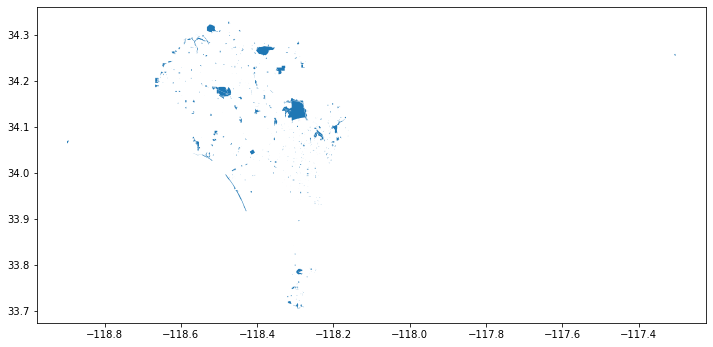

In [71]:
# to get a visual sense of what my map will look like, I create a simple plot
gdf.plot(figsize=(12,12))

In [68]:
# in order to use folium to map our data, I need to make sure the data is using the correct coordinate system, with latitude and longitude. 
# I use a crs command to check to see what projection my data is using.
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [81]:
# after confirming that I'm using the correct projection, I can start to use folium.
# first, I create a simple folium map without any data, centered on Los Angeles.
m = folium.Map(location=[34.05, -118.24], zoom_start=11, tiles='CartoDB positron')
m

In [78]:
# now I can overlay the polygons from the parks geojson file over the folium map. I make sure the popup corresponds to the park name

for _, r in gdf.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'green'})
    folium.Popup(r['name_alpha']).add_to(geo_j)
    geo_j.add_to(m)
m


In [75]:
# to create markers centered on each park, I will need to determine the centroid of each park.
# to determine the centroids, I need to project the data into a different coordinate system that can work with geometries, NAD83. 

gdf = gdf.to_crs(epsg=2263)

gdf['centroid'] = gdf.centroid

In [76]:
# now I will need to project back to our lat/long projection to use folium.
# I also create a new column with the centroid of each park.

gdf = gdf.to_crs(epsg=4326)

gdf['centroid'] = gdf['centroid'].to_crs(epsg=4326)

In [77]:
# check to make sure changes were made.
gdf.head()

,name,shape_area,objectid,park_id,name_alpha,shape_leng,area_acres,issubpark,region,address,name_publi,park_class,cd_real,geometry,centroid
0,Robert F Kennedy Inspiration Memorial Park,6501.37488025,1,1056,ROBERT F KENNEDY PARK (LAUSD) JUA,641.47054538,0.149251627315,N,M,"3400 W Wilshire Blvd, LA 90010",Kennedy (Robert F) Inspiration Memorial Park (...,N,10,"MULTIPOLYGON (((-118.29796 34.06162, -118.2969...",POINT (-118.29749 34.06159)
1,Sycamore Grove Park,691462.199493,2,736,SYCAMORE GROVE PARK,6227.3991903,15.8738513625,N,M,"4702 N Figueroa St, LA 90042",Sycamore Grove Park,C,01,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011...",POINT (-118.20301 34.10007)
2,San Pedro Welcome Park,17402.1579777,3,328,SAN PEDRO WELCOME PARK,560.372862441,0.399500174163,N,P,"451 N Gaffey St, San Pedro 90731",Formerly Welcome Park,N,15,"MULTIPOLYGON (((-118.29286 33.74600, -118.2928...",POINT (-118.29264 33.74621)
3,Country Club Heritage Park,3647.84860118,4,1045,COUNTRY CLUB PARK HERITAGE PLAZA,287.523337381,0.0837434158085,N,M,"1015 S Wilton Pl, LA 90018",AKA Wilton Place Park,N,10,"MULTIPOLYGON (((-118.31504 34.05232, -118.3149...",POINT (-118.31481 34.05236)
4,Watts Cultural Crescent,128793.355722,5,1046,WATTS CULTURAL CRESCENT,2852.11033344,2.95670043382,N,P,"1780 E Santa Ana Blvd, LA 90002",AKA Watts Towers Cultural Cresent,N,15,"MULTIPOLYGON (((-118.24221 33.93945, -118.2422...",POINT (-118.24096 33.93896)


In [80]:
# now I can finally plot my folium map, with the markers in the center of each park.
# I manipulate the code to make it so that when you scroll over a park, the name appears.
# I also make it so that when you click on a park, its area in acres appears.

for _, r in gdf.iterrows():
    lat = r['centroid'].y
    lon = r['centroid'].x
    folium.Marker(location=[lat, lon],popup=r.area_acres, tooltip=r.name_alpha).add_to(m)
m

This folium map shows a large number of parks throughout the city of Los Angeles. This appears contrary to prevailing research from community groups like the Los Angeles Neighborhood Land Trust and even the Department of Parks and Recreation’s Needs Assessment which found that more than half of Los Angeles County is considered “park poor,” with 82% of these areas located in communities of color.

This suggests that parks equity is not merely a pure question of access, or “does a park exist in this area or not?” but rather proportion, or “what is the ratio of park space to population?” and quality “what funding and amenities does this park have?”

We will further explore these questions going forward in our project.

## The Park Power Rangers ##
This notebook (2 of 2) was put together by Leslie Velasquez.

Carolyn, the Pink Ranger, analyzed Census income data and parks data to create a histogram, a bar chart, and static maps. Leslie, the Orange Ranger, analyzed Census income and race data and parks data to create stacked bar charts and an interactive map. We worked on the presentation jointly.